In [1]:
from hidrocomp.series import Flow
import pandas as pd
import plotly as py
import plotly.graph_objects as go

In [2]:
manso_telemetria = pd.read_excel("Rio Manso-Wal.xlsx", sheet_name="66210000")

In [3]:
data = []
for i in manso_telemetria.index:
    data.append(f"{manso_telemetria['Dia '][i]}/{manso_telemetria['Mês'][i]}/{manso_telemetria['Ano'][i]} {manso_telemetria['Hora'][i]}:{manso_telemetria['Min'][i]}")
        
data = pd.to_datetime(data, dayfirst=True)

In [4]:
dados = pd.DataFrame(data=manso_telemetria["Vazão"].values, index=data, dtype="float64", columns=["flow"])
dados.loc[dados["flow"] == -1] = None
dados

,flow
2015-07-01 01:00:00,NaN
2015-07-01 02:00:00,NaN
2015-07-01 03:00:00,NaN
2015-07-01 04:00:00,NaN
2015-07-01 05:00:00,NaN
...,...
2019-08-19 10:00:00,160.0
2019-08-19 11:00:00,160.0
2019-08-19 12:00:00,160.0
2019-08-19 13:00:00,160.0


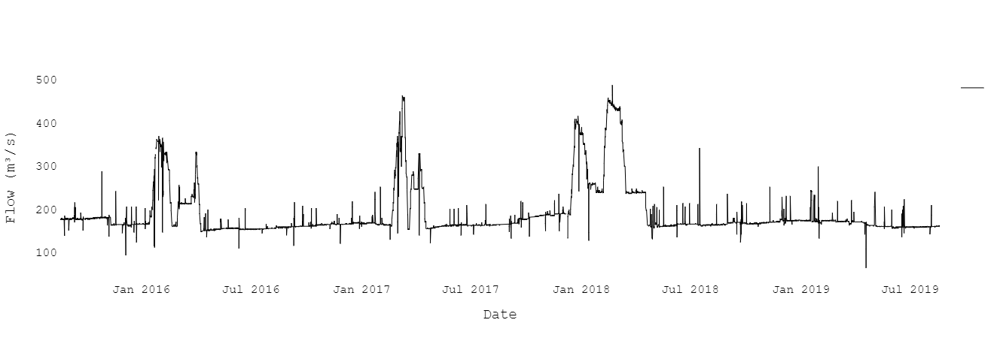

In [5]:
flow = Flow(data=dados)
fig, data = flow.hydrogram("")
py.offline.iplot(fig)

In [7]:
fig = go.Figure(fig)
fig.write_image("hydro_hour.png", width=1200, height=800)

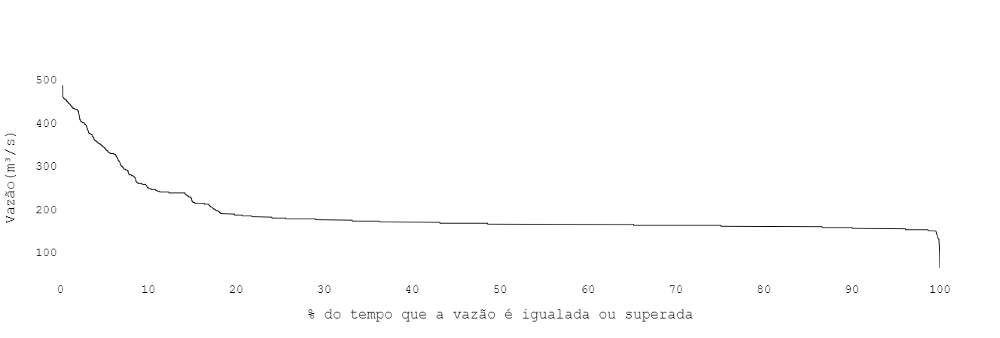

In [6]:
fig, data = flow.rating_curve("")
py.offline.iplot(fig)

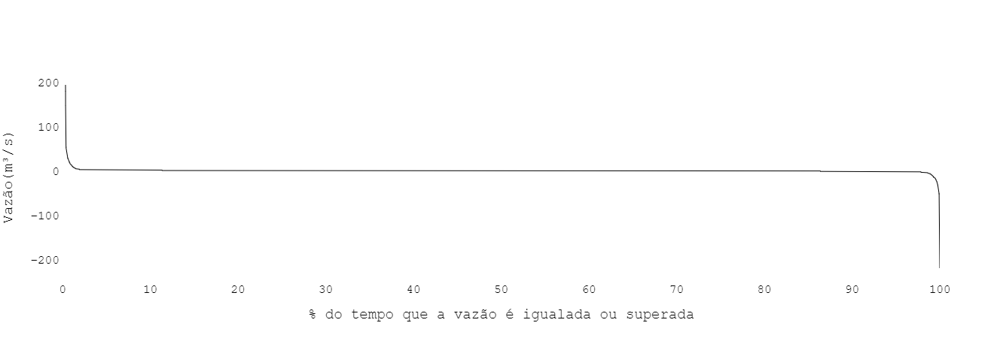

In [7]:
df1 = dados["flow"].loc["2015-07-01 01:00:00":].to_frame().reset_index()
df2 = dados["flow"].loc["2015-07-01 02:00:00":].to_frame().reset_index()
df = df1-df2
df.index = dados.index
del df["index"]
df_flow = Flow(data=df)
fig, data_fig = df_flow.rating_curve("")
py.offline.iplot(fig)